In [1]:
import metpy
import datetime
import rioxarray
import os
import hvplot.xarray
import hvplot

import geopandas as gpd
import xarray as xr
import numpy as np
import cartopy.crs as ccrs
import matplotlib.pyplot as plt
import pandas as pd
import cartopy.feature as cfeature

from tqdm.notebook import tqdm
from shapely.geometry import mapping
from dask import delayed
from dask.distributed import Client

All data downloaded from [here](https://registry.opendata.aws/noaa-goes/)

Grid mappings that metpy expects to find in attributes somewhere must be one of [these](https://cfconventions.org/Data/cf-conventions/cf-conventions-1.7/cf-conventions.html#appendix-grid-mappings)

[Super useful GOES image description](https://makersportal.com/blog/2018/11/25/goes-r-satellite-latitude-and-longitude-grid-projection-algorithm)

[Beginner's guide to GOES data](https://www.goes-r.gov/downloads/resources/documents/Beginners_Guide_to_GOES-R_Series_Data.pdf)

[GOES AOD Data description](https://www.star.nesdis.noaa.gov/goesr/documents/ATBDs/Baseline/ATBD_GOES-R_Aerosol_Optical_Depth_v4.2_Feb2018.pdf), table 3-22 on page 67 describes the output data
- [all GOES documents](https://www.goes-r.gov/resources/docs.html)

In [7]:
def get_projection(ds, variable):
    dat = ds.metpy.parse_cf(variable)
    return dat, dat.metpy.cartopy_crs

def set_crs(ds, variable):
    dat, geos = get_projection(ds, variable=variable)
    ds.attrs["crs"] = geos
    
def change_xy_to_geospatial(ds, variable):
    dat, geos = get_projection(ds, variable=variable)
    x = dat.x
    y = dat.y

    sat_h = ds.goes_imager_projection.perspective_point_height
    x2 = ds.x * sat_h
    y2 = ds.y * sat_h
    
    ds.attrs["crs"] = geos
    ds = ds.assign_coords(x=ds.x * sat_h, y=ds.y * sat_h)
    
    ds.x.attrs = {'units': 'm',
     'axis': 'X',
     'long_name': 'X sweep in crs',
    }
    ds.y.attrs = {'units': 'm',
     'axis': 'Y',
     'long_name': 'Y sweep in crs',
    }

    return ds

def add_lat_lon(ds, variable):
    dat, geos = get_projection(ds, variable=variable)
    x = dat.x
    y = dat.y

    sat_h = ds.goes_imager_projection.perspective_point_height
    x2 = ds.x * sat_h
    y2 = ds.y * sat_h
    
    ds.attrs["crs"] = geos
    ds.coords["x2"] = x2
    ds.coords["y2"] = y2
    ds["x2"].attrs["long_name"] = "x sweep in crs units (m); x * sat_height"
    ds["y2"].attrs["long_name"] = "y sweep in crs units (m); y * sat_height"
    
#     ds = ds.assign_coords(x=ds.x * sat_h, y=ds.y * sat_h)

    X, Y = np.meshgrid(x2, y2)
    a = ccrs.PlateCarree().transform_points(geos, X, Y)
    lons, lats, _ = a[:, :, 0], a[:, :, 1], a[:, :, 2]

    ds = ds.assign_coords({
            "lat":(["y","x"],lats),
            "lon":(["y","x"],lons)
        })
    ds.lat.attrs["units"] = "degrees_north"
    ds.lon.attrs["units"] = "degrees_east"
    return ds

def drop_coords_dims(ds):
    ds = ds.drop_vars(
    [
        'x_image', 
        'y_image', 
        'sunglint_angle', 
        'retrieval_local_zenith_angle', 
        'quantitative_local_zenith_angle',
        'retrieval_solar_zenith_angle',
        'quantitative_solar_zenith_angle',
        'aod_product_wavelength',
        'land_sensor_band_wavelengths',
        'sea_sensor_band_wavelengths',
        'land_sensor_band_ids',
        'sea_sensor_band_ids',
        'x2', 
        'y2'
    ]).drop_dims(
    [
        'number_of_time_bounds',
        'number_of_image_bounds',
        'number_of_sunglint_angle_bounds',
        'number_of_LZA_bounds',
        'number_of_SZA_bounds',
        'land_sensor_bands',
        'sea_sensor_bands',
        'latitude_bands',
        'number_of_latitude_band_bounds',
        'num_area_types'
    ])[['AOD', 'DQF']]
    return ds

# Reading the Data In

In [28]:
aod = xr.open_dataset('/Volumes/Shores/GOES/AODC/2021/001/18/OR_ABI-L2-AODC-M6_G16_s20210011811176_e20210011813549_c20210011816461.nc')
albedo = xr.open_dataset('/Volumes/Shores/GOES/LSAC/2021/230/21/OR_ABI-L2-LSAC-M6_G16_s20212302131172_e20212302133545_c20212302135044.nc')
rainfall = xr.open_dataset('/Volumes/Shores/GOES/RRQPEF/2021/001/00/OR_ABI-L2-RRQPEF-M6_G16_s20210010000209_e20210010009517_c20210010010020.nc')
precipitable_water = xr.open_dataset('/Volumes/Shores/GOES/TPWC/2021/001/00/OR_ABI-L2-TPWC-M6_G16_s20210010001176_e20210010003549_c20210010005512.nc')
temp = xr.open_dataset('/Volumes/Shores/GOES/LSTC/2021/001/00/OR_ABI-L2-LSTC-M6_G16_s20210010001176_e20210010003549_c20210010004420.nc')

In [234]:
aod = change_xy_to_geospatial(aod, 'AOD')
albedo = change_xy_to_geospatial(albedo, 'LSA')
rainfall = change_xy_to_geospatial(rainfall, 'RRQPE')
precipitable_water = change_xy_to_geospatial(precipitable_water, 'TPW')
temp = change_xy_to_geospatial(temp, 'LST')

In [29]:
aod

<xarray.Dataset>
Dimensions:                                                 (y: 1500, x: 2500,
                                                             number_of_time_bounds: 2,
                                                             number_of_image_bounds: 2,
                                                             number_of_sunglint_angle_bounds: 2,
                                                             number_of_LZA_bounds: 2,
                                                             number_of_SZA_bounds: 2,
                                                             land_sensor_bands: 3,
                                                             sea_sensor_bands: 4,
                                                             latitude_bands: 18,
                                                             number_of_latitude_band_bounds: 2,
                                                             num_area_types: 2)
Coordinates:
    t                                                       datetime64[ns] ...
  * y                                                       (y) float32 0.128...
  * x                                                       (x) float32 -0.10...
    y_image                                                 float32 ...
    x_image                                                 float32 ...
    sunglint_angle                                          float32 ...
    retrieval_local_zenith_angle                            float32 ...
    quantitative_local_zenith_angle                         float32 ...
    retrieval_solar_zenith_angle                            float32 ...
    quantitative_solar_zenith_angle                         float32 ...
    aod_product_wavelength                                  float32 ...
  * latitude_bands                                          (latitude_bands) float32 ...
Dimensions without coordinates: number_of_time_bounds, number_of_image_bounds,
                                number_of_sunglint_angle_bounds,
                                number_of_LZA_bounds, number_of_SZA_bounds,
                                land_sensor_bands, sea_sensor_bands,
                                number_of_latitude_band_bounds, num_area_types
Data variables: (12/62)
    AOD                                                     (y, x) float32 ...
    DQF                                                     (y, x) float32 ...
    AE1                                                     (y, x) float32 ...
    AE2                                                     (y, x) float32 ...
    AE_DQF                                                  (y, x) float32 ...
    time_bounds                                             (number_of_time_bounds) datetime64[ns] ...
    ...                                                      ...
    lat_band_min_aod550_sea                                 (latitude_bands) float32 ...
    lat_band_max_aod550_sea                                 (latitude_bands) float32 ...
    lat_band_mean_aod550_sea                                (latitude_bands) float32 ...
    lat_band_std_dev_aod550_sea                             (latitude_bands) float32 ...
    percent_uncorrectable_GRB_errors                        float32 ...
    percent_uncorrectable_L0_errors                         float32 ...
Attributes: (12/29)
    naming_authority:          gov.nesdis.noaa
    Conventions:               CF-1.7
    Metadata_Conventions:      Unidata Dataset Discovery v1.0
    standard_name_vocabulary:  CF Standard Name Table (v35, 20 July 2016)
    institution:               DOC/NOAA/NESDIS > U.S. Department of Commerce,...
    project:                   GOES
    ...                        ...
    cdm_data_type:             Image
    time_coverage_start:       2021-01-01T18:11:17.6Z
    time_coverage_end:         2021-01-01T18:13:54.9Z
    timeline_id:               ABI Mode 6
    production_data_source:    Realtime
    id:                        449d301c-462b

In [75]:
aod.where(aod.AOD < aod.max_aod550_land)

<xarray.Dataset>
Dimensions:                                                 (y: 1500, x: 2500,
                                                             number_of_time_bounds: 2,
                                                             number_of_image_bounds: 2,
                                                             number_of_sunglint_angle_bounds: 2,
                                                             number_of_LZA_bounds: 2,
                                                             number_of_SZA_bounds: 2,
                                                             land_sensor_bands: 3,
                                                             sea_sensor_bands: 4,
                                                             latitude_bands: 18,
                                                             number_of_latitude_band_bounds: 2,
                                                             num_area_types: 2)
Coordinates:
    t                                                       datetime64[ns] 20...
  * y                                                       (y) float32 0.128...
  * x                                                       (x) float32 -0.10...
    y_image                                                 float32 0.08624
    x_image                                                 float32 -0.03136
    sunglint_angle                                          float32 40.0
    retrieval_local_zenith_angle                            float32 90.0
    quantitative_local_zenith_angle                         float32 60.0
    retrieval_solar_zenith_angle                            float32 90.0
    quantitative_solar_zenith_angle                         float32 80.0
    aod_product_wavelength                                  float32 0.55
  * latitude_bands                                          (latitude_bands) float32 ...
Dimensions without coordinates: number_of_time_bounds, number_of_image_bounds,
                                number_of_sunglint_angle_bounds,
                                number_of_LZA_bounds, number_of_SZA_bounds,
                                land_sensor_bands, sea_sensor_bands,
                                number_of_latitude_band_bounds, num_area_types
Data variables: (12/62)
    AOD                                                     (y, x) float32 na...
    DQF                                                     (y, x) float32 na...
    AE1                                                     (y, x) float32 na...
    AE2                                                     (y, x) float32 na...
    AE_DQF                                                  (y, x) float32 na...
    time_bounds                                             (number_of_time_bounds, y, x) datetime64[ns] ...
    ...                                                      ...
    lat_band_min_aod550_sea                                 (latitude_bands, y, x) float32 ...
    lat_band_max_aod550_sea                                 (latitude_bands, y, x) float32 ...
    lat_band_mean_aod550_sea                                (latitude_bands, y, x) float32 ...
    lat_band_std_dev_aod550_sea                             (latitude_bands, y, x) float32 ...
    percent_uncorrectable_GRB_errors                        (y, x) float64 na...
    percent_uncorrectable_L0_errors                         (y, x) float64 na...
Attributes: (12/29)
    naming_authority:          gov.nesdis.noaa
    Conventions:               CF-1.7
    Metadata_Conventions:      Unidata Dataset Discovery v1.0
    standard_name_vocabulary:  CF Standard Name Table (v35, 20 July 2016)
    institution:               DOC/NOAA/NESDIS > U.S. Department of Commerce,...
    project:                   GOES
    ...                        ...
    cdm_data_type:             Image
    time_coverage_start:       2021-01-01T18:11:17.6Z
    time_coverage_end:         2021-01-01T18:13:54.9Z
    timeline_id:               ABI Mode 6
    produ

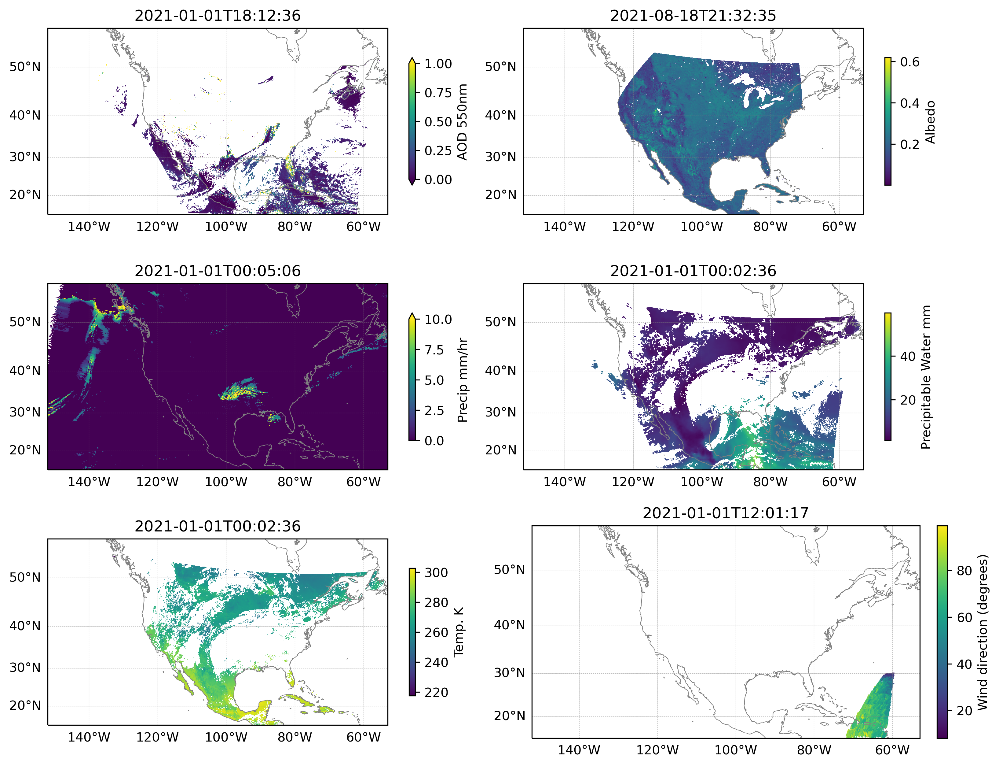

In [7]:
figsize = (11, 8.5)

fig = plt.figure(figsize=figsize, dpi=300)

ax1 = fig.add_subplot(3, 2, 1, projection=ccrs.Mercator())
ax2 = fig.add_subplot(3, 2, 2, projection=ccrs.Mercator())
ax3 = fig.add_subplot(3, 2, 3, projection=ccrs.Mercator())
ax4 = fig.add_subplot(3, 2, 4, projection=ccrs.Mercator())
ax5 = fig.add_subplot(3, 2, 5, projection=ccrs.Mercator())
ax6 = fig.add_subplot(3, 2, 6, projection=ccrs.Mercator())

def plot(ds, variable, ax, **kwargs):
    proj = ds.attrs["crs"]
    ds[variable].plot(ax=ax, transform=proj, **kwargs)

plot(aod, 'AOD', ax1, vmin=0, vmax=1, cbar_kwargs={'shrink': 0.6, 'label': 'AOD 550nm'})
plot(albedo, 'LSA', ax2, cbar_kwargs={'shrink': 0.6, 'label': 'Albedo'})
plot(rainfall, 'RRQPE', ax3, vmax=10, cbar_kwargs={'shrink': 0.6, 'label': 'Precip mm/hr'})
plot(precipitable_water, 'TPW', ax4, cbar_kwargs={'shrink': 0.6, 'label': 'Precipitable Water mm'})
plot(temp, 'LST', ax5, cbar_kwargs={'shrink': 0.6, 'label': 'Temp. K'})

mappable = ax6.quiver(
    df['Longitude'], 
    df['Latitude'], 
    df['U'], 
    df['V'], 
    df['Direction'], transform=ccrs.PlateCarree(), scale=850)
cb = fig.colorbar(mappable, fraction=0.027, pad=0.04)
cb.set_label('Wind direction (degrees)')

ax1.set_title(aod.t.values.astype('M8[s]'))
ax2.set_title(albedo.t.values.astype('M8[s]'))
ax3.set_title(rainfall.t.values.astype('M8[s]'))
ax4.set_title(precipitable_water.t.values.astype('M8[s]'))
ax5.set_title(temp.t.values.astype('M8[s]'))
ax6.set_title(winds.time[0].values.astype('M8[s]'))

x = aod.x
y = aod.y
for ax in [ax1, ax2, ax3, ax4, ax5, ax6]:
    ax.set_extent((x.min(), x.max(), y.min(), y.max()), crs=aod.attrs['crs'])
    ax.coastlines(resolution='50m', color='gray', linewidth=0.5)
    gl = ax.gridlines(draw_labels=True, 
                      linewidth=0.3, 
                      color='gray', 
                      alpha=0.5, 
                      linestyle='--')
    gl.top_labels=False
    gl.right_labels=False

fig.tight_layout()

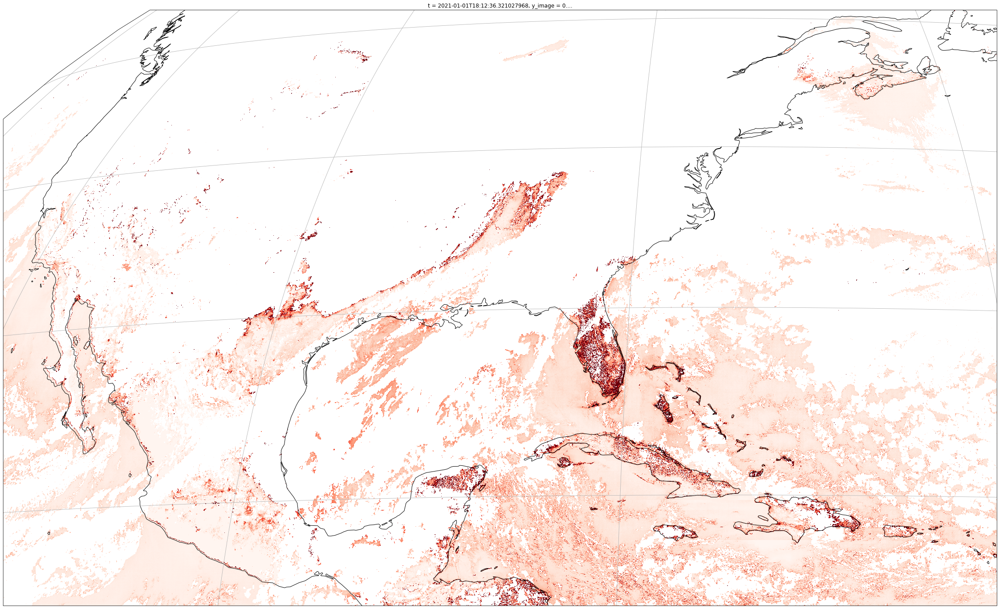

In [8]:
fig = plt.figure(figsize=(40, 40))
proj = ccrs.Geostationary(
    central_longitude=aod.goes_imager_projection.attrs['longitude_of_projection_origin'],
    satellite_height=aod.goes_imager_projection.attrs['perspective_point_height'])

ax = fig.add_subplot(projection = proj)

aod['AOD'].plot(ax=ax, transform=proj, add_colorbar=False, vmin=0, vmax=1, cmap='Reds')

ax.coastlines()
ax.gridlines()

# Split by Timezone

## Using Rioxarray

In [62]:
# timezone file from here: https://github.com/evansiroky/timezone-boundary-builder
tz = gpd.read_file('data/combined-with-oceans.json')

<AxesSubplot:>

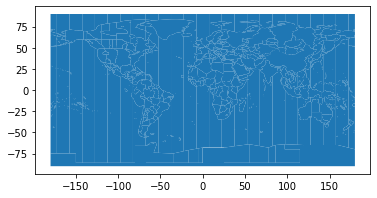

In [63]:
tz.plot()

<AxesSubplot:>

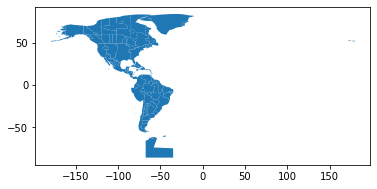

In [5]:
america = tz[tz["tzid"].str.contains("America")]
america.plot()

In [65]:
east_cost = tz[tz.tzid=='America/New_York']
east_cost = east_cost.to_crs(ds.attrs['crs'].to_string())

<AxesSubplot:>

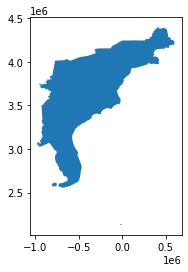

In [66]:
east_cost.plot()

<AxesSubplot:>

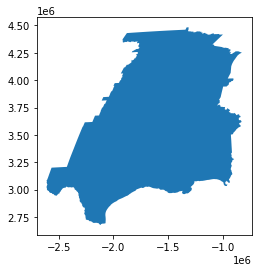

In [74]:
central = tz[tz.tzid=='America/Chicago']
central = central.to_crs(ds.attrs['crs'].to_string())
central.plot()

In [75]:
proj = ds.attrs['crs']
ds.rio.write_crs(proj.to_string(), inplace=True)
ds.attrs['crs'] = proj

In [112]:
central_clip = ds['AOD'].rio.clip(central.geometry.apply(mapping))
east_clip = ds['AOD'].rio.clip(east_cost.geometry.apply(mapping))

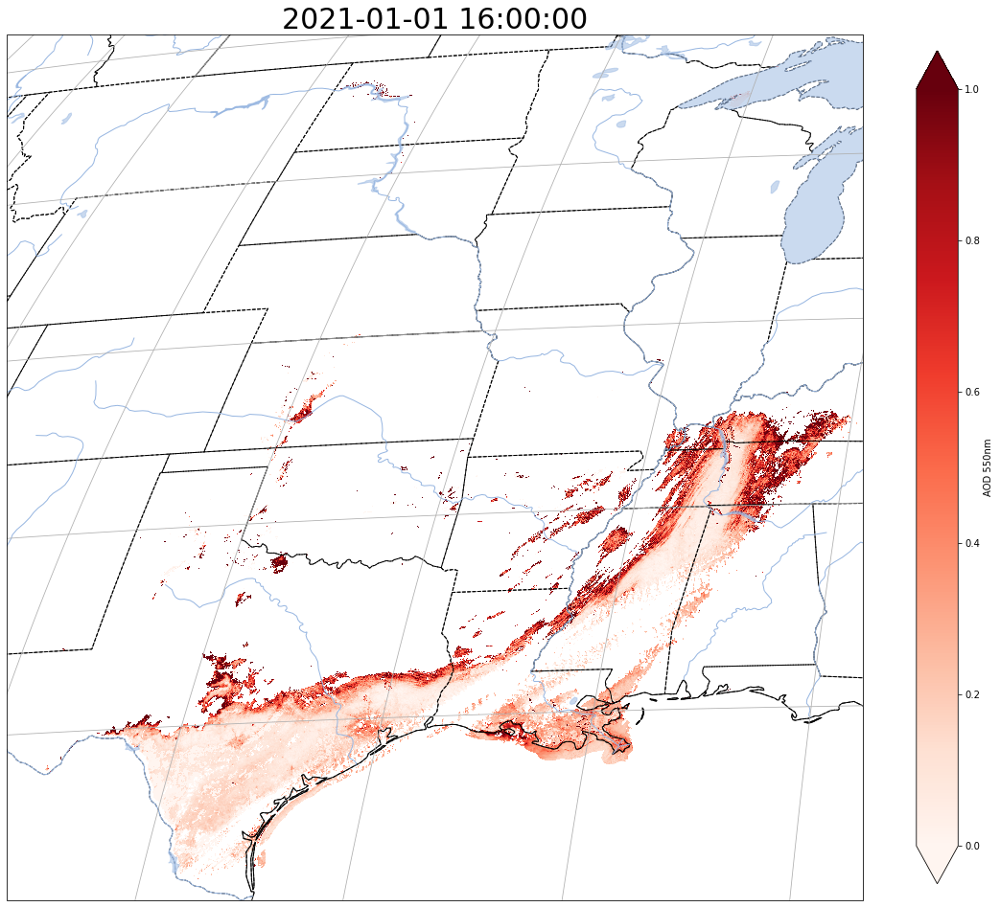

In [113]:
plot_thing(central_clip, time_isel=16)

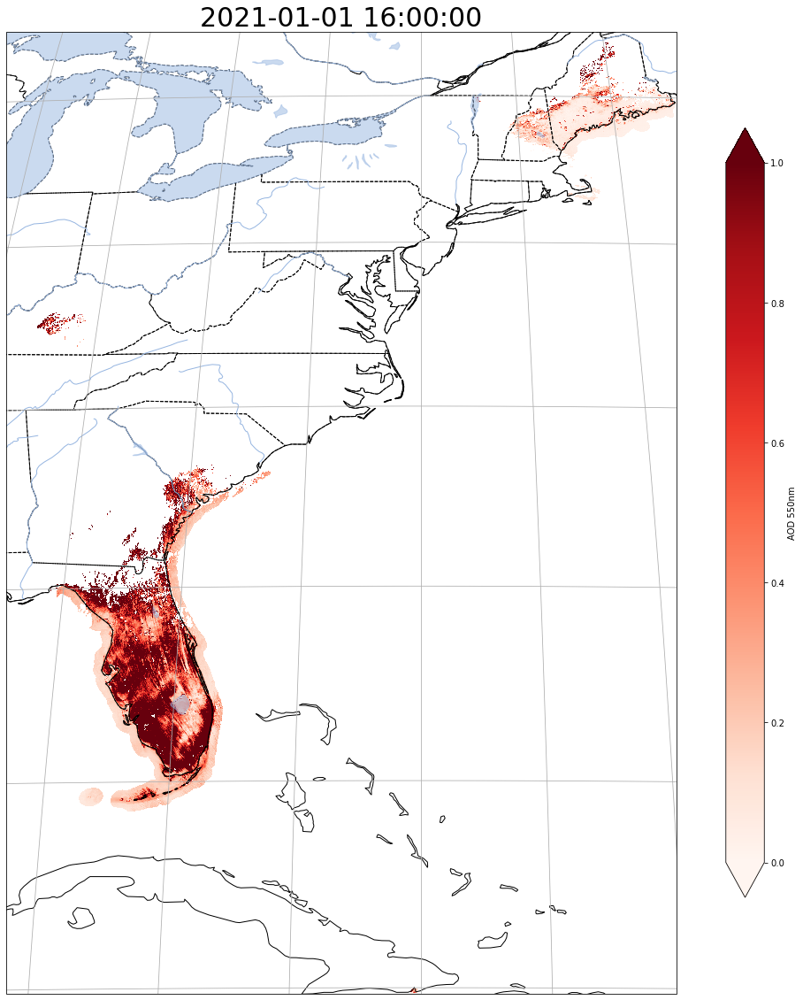

In [114]:
plot_thing(east_clip, time_isel=16)

In [108]:
def plot_thing(thing, time_isel=0):
    fig = plt.figure(figsize=(20, 20))
    proj = ccrs.Geostationary(
        central_longitude=thing.goes_imager_projection.attrs['longitude_of_projection_origin'],
        satellite_height=thing.goes_imager_projection.attrs['perspective_point_height'])

    ax = fig.add_subplot(projection = proj)

    thing.isel(t=time_isel).plot(
        ax=ax, 
        transform=proj, 
        vmin=0, 
        vmax=1, 
        cmap='Reds',
        cbar_kwargs={'label': 'AOD 550nm', 'shrink': 0.8}
    )


    ts = pd.to_datetime(str(thing.t.values[time_isel])) 
    ax.set_title(ts.strftime('%Y-%m-%d %H:%M:%S'),
                fontdict={'fontsize': 30})

    ax.coastlines()
    ax.add_feature(cfeature.STATES, linestyle='--')
    ax.add_feature(cfeature.LAKES, alpha=0.5)
    ax.add_feature(cfeature.RIVERS)
    ax.gridlines();

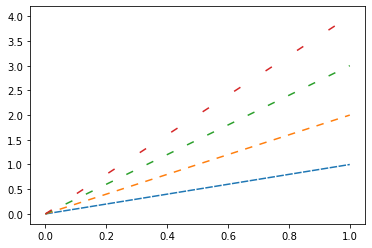

In [101]:
fig,ax = plt.subplots()
ax.plot([0, 1], [0, 1], linestyle='--', dashes=(5, 1)) #length of 5, space of 1
ax.plot([0, 1], [0, 2], linestyle='--', dashes=(5, 5)) #length of 5, space of 5
ax.plot([0, 1], [0, 3], linestyle='--', dashes=(5, 10)) #length of 5, space of 10
ax.plot([0, 1], [0, 4], linestyle='--', dashes=(5, 20)) #length of 5, space of 20

## Trying to use regionmask

* [2d mask](https://regionmask.readthedocs.io/en/stable/notebooks/mask_2D.html#creating-a-mask)
* [Using geopandas](https://regionmask.readthedocs.io/en/stable/notebooks/geopandas.html?highlight=from_geopandas)
* [github](https://github.com/regionmask/regionmask)


In [6]:
winds = xr.open_dataset('/Volumes/Shores/GOES/DMWC/2021/001/12/OR_ABI-L2-DMWC-M6C02_G16_s20210011201176_e20210011203549_c20210011210439.nc')

n_winds = winds.nMeasures.max().values.item()
lons, lats, windspeed, direction = [], [], [], []
for i in range(n_winds):
    wind = winds.sel(nMeasures=i)
    lats.append(wind.lat.values.item())
    lons.append(wind.lon.values.item())
    windspeed.append(wind['wind_speed'].values.item())
    direction.append(wind['wind_direction'].values.item())

df = pd.DataFrame({'Longitude': lons, 'Latitude': lats, 'Windspeed': windspeed, 'Direction': direction})
df['U'] = df['Windspeed'] * np.cos(np.radians(df['Direction']))
df['V'] = df['Windspeed'] * np.sin(np.radians(df['Direction']))

In [ ]:
import regionmask

In [40]:
mask = regionmask.from_geopandas(tz,abbrevs='tzid', names='tzid')
mask

<regionmask.Regions>
Name:     unnamed
overlap:  False

Regions:
  0     Africa/Abidjan     Africa/Abidjan
  1       Africa/Accra       Africa/Accra
  2 Africa/Addis_Ababa Africa/Addis_Ababa
  3     Africa/Algiers     Africa/Algiers
  4      Africa/Asmara      Africa/Asmara
 ..                ...                ...
445          Etc/GMT+8          Etc/GMT+8
446          Etc/GMT+9          Etc/GMT+9
447         Etc/GMT+10         Etc/GMT+10
448         Etc/GMT+11         Etc/GMT+11
449         Etc/GMT+12         Etc/GMT+12

[450 regions]

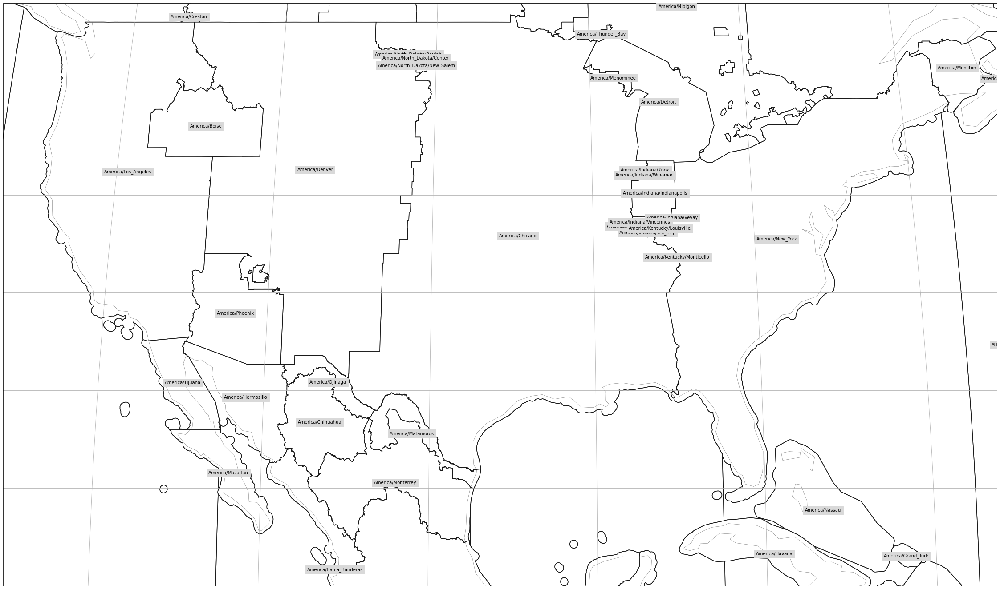

In [41]:
fig = plt.figure(figsize=(40, 40))
ax = fig.add_subplot(projection = ccrs.Robinson(central_longitude=-95))

mask.plot(label='name', ax=ax)
ax.set_extent([-125, -66.5, 20, 50], ccrs.PlateCarree())

ax.gridlines()

In [42]:
masked_aod = mask.mask(aod)

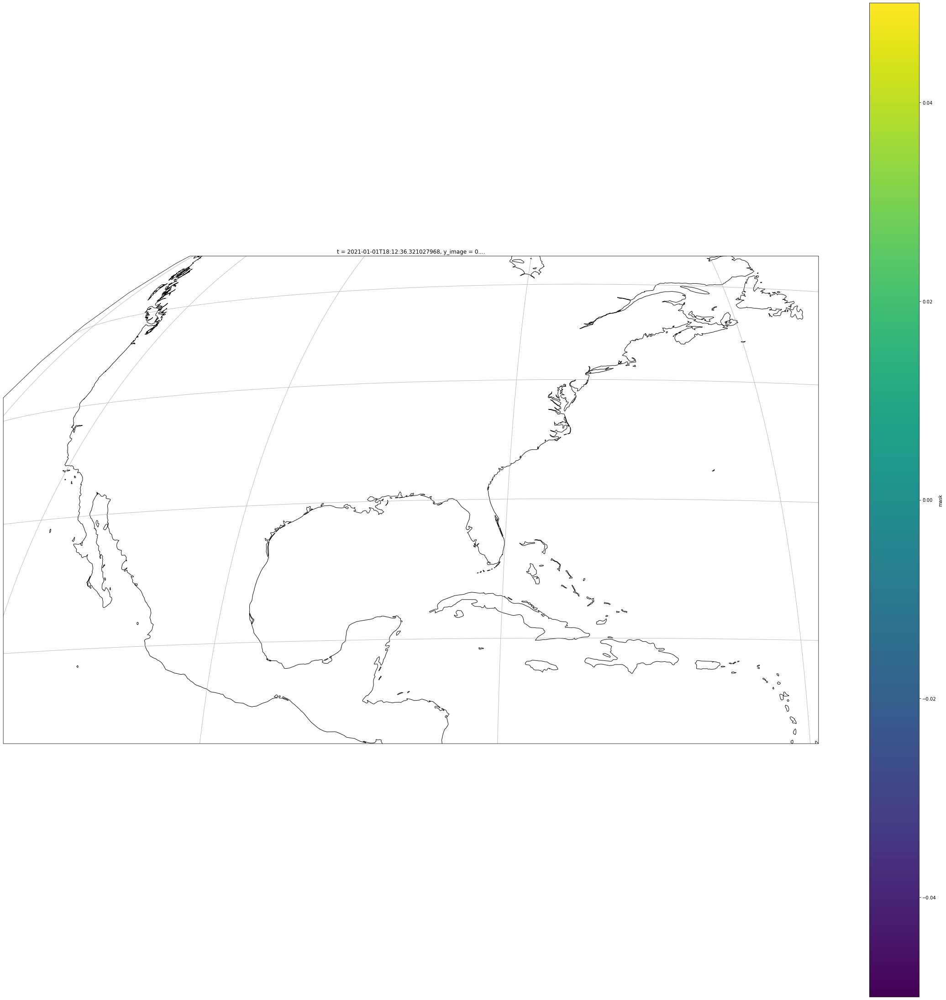

In [46]:
fig = plt.figure(figsize=(40, 40))
proj = ccrs.Geostationary(
    central_longitude=aod.goes_imager_projection.attrs['longitude_of_projection_origin'],
    satellite_height=aod.goes_imager_projection.attrs['perspective_point_height'])

ax = fig.add_subplot(projection = proj)

masked_aod.where(mask == f'America/New_York').plot(x='x2', y='y2', transform=aod.attrs['crs'], ax=ax)
# ax.set_extent([-125, -66.5, 20, 50], ccrs.PlateCarree())

ax.gridlines()
ax.coastlines()

In [28]:
reg = np.unique(masked_aod.values)
reg = reg[~np.isnan(reg)]
abbrevs = mask[reg].abbrevs

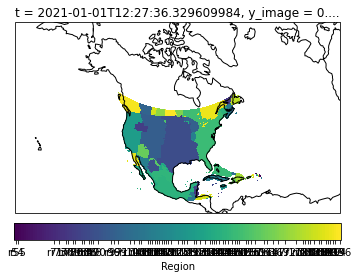

In [34]:
proj = ccrs.LambertConformal(central_longitude=-100)
ax = plt.subplot(111, projection=proj)

low = masked_aod.min()
high = masked_aod.max()

levels = np.arange(low - 0.5, high + 1)

h = masked_aod.plot.pcolormesh(x='x2', y='y2',
    ax=ax, transform=aod.attrs['crs'], levels=levels, add_colorbar=False
)

# for colorbar: find abbreviations of all regions that were selected
reg = np.unique(masked_aod.values)
reg = reg[~np.isnan(reg)]
abbrevs = mask[reg].abbrevs

cbar = plt.colorbar(h, orientation="horizontal", fraction=0.075, pad=0.05)

cbar.set_ticks(reg)
cbar.set_ticklabels(abbrevs)
cbar.set_label("Region")

ax.coastlines()

# fine tune the extent
ax.set_extent([200, 330, 10, 75], crs=ccrs.PlateCarree())

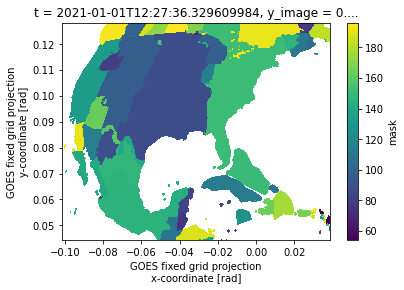

In [15]:
masked_aod.plot()